In [1]:
# installing the Kaggle library
!pip install kaggle

In [2]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Importing the file

In [3]:
!kaggle competitions download -c dogs-vs-cats

... resuming from 5242880 bytes (846333809 bytes left) ...
 98% 797M/812M [00:03<00:00, 310MB/s]
100% 812M/812M [00:03<00:00, 268MB/s]


In [4]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [5]:
!pip install zipfile36

In [6]:
import os
from zipfile import ZipFile

In [7]:
!kaggle competitions download -c dogs-vs-cats -f train.zip # redownload the file
!unzip train.zip # unzip the file
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip' # change to the actual name of the downloaded file
with ZipFile(dataset, 'r') as zip:
  zip.extractall() # extract using the zip object
  print('The dataset is extracted')

Streaming output truncated to the last 5000 lines.
  inflating: train/dog.55.jpg        
  inflating: train/dog.550.jpg       
  inflating: train/dog.5500.jpg      
  inflating: train/dog.5501.jpg      
  inflating: train/dog.5502.jpg      
  inflating: train/dog.5503.jpg      
  inflating: train/dog.5504.jpg      
  inflating: train/dog.5505.jpg      
  inflating: train/dog.5506.jpg      
  inflating: train/dog.5507.jpg      
  inflating: train/dog.5508.jpg      
  inflating: train/dog.5509.jpg      
  inflating: train/dog.551.jpg       
  inflating: train/dog.5510.jpg      
  inflating: train/dog.5511.jpg      
  inflating: train/dog.5512.jpg      
  inflating: train/dog.5513.jpg      
  inflating: train/dog.5514.jpg      
  inflating: train/dog.5515.jpg      
  inflating: train/dog.5516.jpg      
  inflating: train/dog.5517.jpg      
  inflating: train/dog.5518.jpg      
  inflating: train/dog.5519.jpg      
  inflating: train/dog.552.jpg       
  inflating: train/dog.5520.jpg      

In [8]:
# counting number of files in train folder
import os
path,dirs,files = next(os.walk(r'/content/train'))
file_count = len(files)
print("Number of images : ",file_count)

Number of images :  25000


# Printing the names of Image

In [9]:
file_names_train= os.listdir(r'/content/train')
print(file_names_train)

['cat.7768.jpg', 'dog.8779.jpg', 'cat.10763.jpg', 'cat.12000.jpg', 'dog.11792.jpg', 'dog.3836.jpg', 'cat.7678.jpg', 'cat.7638.jpg', 'dog.10234.jpg', 'cat.12107.jpg', 'dog.3635.jpg', 'dog.5369.jpg', 'cat.3097.jpg', 'dog.11345.jpg', 'cat.8156.jpg', 'dog.11744.jpg', 'cat.2421.jpg', 'dog.2455.jpg', 'cat.4683.jpg', 'cat.1416.jpg', 'dog.11700.jpg', 'cat.7002.jpg', 'dog.1155.jpg', 'cat.6150.jpg', 'cat.611.jpg', 'cat.1170.jpg', 'dog.4548.jpg', 'dog.953.jpg', 'dog.437.jpg', 'cat.10565.jpg', 'cat.9500.jpg', 'dog.7192.jpg', 'cat.11446.jpg', 'cat.616.jpg', 'cat.9663.jpg', 'cat.9203.jpg', 'dog.10565.jpg', 'dog.9125.jpg', 'dog.11074.jpg', 'dog.1564.jpg', 'dog.6004.jpg', 'dog.3684.jpg', 'cat.3446.jpg', 'cat.3836.jpg', 'dog.4222.jpg', 'cat.12324.jpg', 'dog.8522.jpg', 'cat.3648.jpg', 'cat.11457.jpg', 'cat.11975.jpg', 'cat.3575.jpg', 'cat.388.jpg', 'cat.6898.jpg', 'cat.6286.jpg', 'cat.8697.jpg', 'cat.4793.jpg', 'cat.1759.jpg', 'cat.12086.jpg', 'dog.11036.jpg', 'cat.3714.jpg', 'cat.2470.jpg', 'cat.10192.

Importing the Dependencies

In [10]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from sklearn.model_selection import train_test_split

Displaying the images of dogs and cats

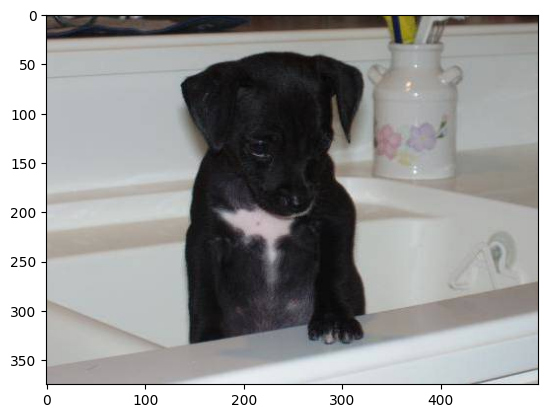

In [11]:
#Displaying dog image
img = mpimg.imread('/content/train/dog.8298.jpg')
plt.imshow(img)


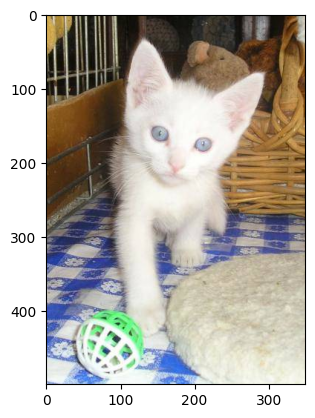

In [12]:
#Displaying cat image
img = mpimg.imread('/content/train/cat.8298.jpg')
plt.imshow(img)

In [13]:
file_names_train= os.listdir(r'/content/train/')

cat_count =0
dog_count =0
for i in range(len(file_names_train)):
    name= file_names_train[i].split('.')
    if name[0] == 'cat':
        cat_count+=1
    else:
        dog_count+=1

print(f'Number of Dog Image: {dog_count}\nNumber of Cat Image: {cat_count}')


Number of Dog Image: 12500
Number of Cat Image: 12500


In [14]:
#creating a directory for resized images
os.mkdir('/content/resizeimage')

In [15]:
original_folder = r'/content/train/'


resized_folder = r'/content/resizeimage/'


file_name = os.listdir(resized_folder)


#for resizing the cat image
for i in range(1000):
    file_name = str(f'cat.{i}.jpg')
    image_path = original_folder + file_name
    img = Image.open(image_path)
    img = img.resize((224,224))
    img = img.convert('RGB')

    new_image_path = resized_folder + file_name
    img.save(new_image_path)


#for resizing the dog image
for i in range(1000):
    file_name = str(f'dog.{i}.jpg')
    image_path = original_folder + file_name
    img = Image.open(image_path)
    img = img.resize((224,224))
    img = img.convert('RGB')

    new_image_path = resized_folder + file_name
    img.save(new_image_path)



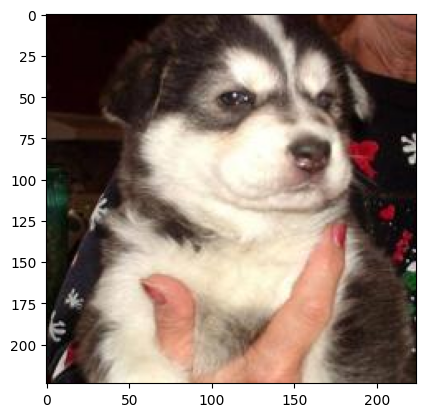

In [16]:
#Displaying resize dog image
img = mpimg.imread('/content/resizeimage/dog.345.jpg')
plt.imshow(img)


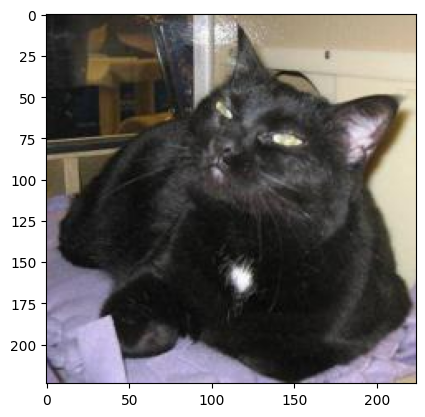

In [17]:
#Display the image of cat
img = mpimg.imread('/content/resizeimage/cat.345.jpg')
plt.imshow(img)

Creating the Labels for resized image of dogs and cats

- Cat = 0
- Dog = 1

In [18]:
# creaing a for loop to assign labels
filenames = os.listdir(r'/content/resizeimage/')
labels = []

for i in range(len(filenames)):

  file_name = filenames[i]
  label = file_name[0:3]

  if label == 'dog':
    labels.append(1)

  else:
    labels.append(0)

In [19]:
len(labels)

2000

In [20]:
print(labels)

[0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 

In [21]:
file_names_train= os.listdir(r'/content/resizeimage/')

cat_count =0
dog_count =0
for i in range(len(file_names_train)):
    name= file_names_train[i].split('.')
    if name[0] == 'cat':
        cat_count+=1
    else:
        dog_count+=1

print(f'Number of Dog Image: {dog_count}\nNumber of Cat Image: {cat_count}')


Number of Dog Image: 1000
Number of Cat Image: 1000


In [22]:
import cv2
import glob

In [23]:
#Changing the extention of the train image
img_dir = r'/content/resizeimage/'

img_ext = ['png','jpg']

files =[]


[files.extend(glob.glob(img_dir+ '*.' + e)) for e in img_ext]

dog_cat_img = np.asarray([cv2.imread(file) for file in files])

In [24]:
dog_cat_img.shape

(2000, 224, 224, 3)

In [25]:
x = dog_cat_img
y = np.asarray(labels)

In [26]:
#Dividing the data into train and test

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2 ,random_state=2)

In [27]:
# scaling the data
x_train_scaled = x_train/255

x_test_scaled = x_test/255

In [28]:
import tensorflow as tf
import tensorflow_hub as hub

In [29]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

In [30]:
num_of_classes = 2

model = tf.keras.Sequential([

    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)

])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [31]:
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['acc']
)

In [32]:
model.fit(x_train_scaled, y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 12s 177ms/step - loss: 0.1820 - acc: 0.9256
Epoch 2/5
50/50 [==============================] - 9s 184ms/step - loss: 0.0713 - acc: 0.9775
Epoch 3/5
50/50 [==============================] - 9s 177ms/step - loss: 0.0541 - acc: 0.9819
Epoch 4/5
50/50 [==============================] - 9s 187ms/step - loss: 0.0447 - acc: 0.9875
Epoch 5/5
50/50 [==============================] - 10s 191ms/step - loss: 0.0362 - acc: 0.9881


In [33]:
score, acc = model.evaluate(x_test_scaled, y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

13/13 [==============================] - 3s 185ms/step - loss: 0.0361 - acc: 0.9875
Test Loss = 0.0360550582408905
Test Accuracy = 0.987500011920929


**Predictive System**

In [36]:
!pip install opencv-python

In [37]:
import cv2
from google.colab.patches import cv2_imshow

Path of the image to be predicted: /content/Cat_Image.webp


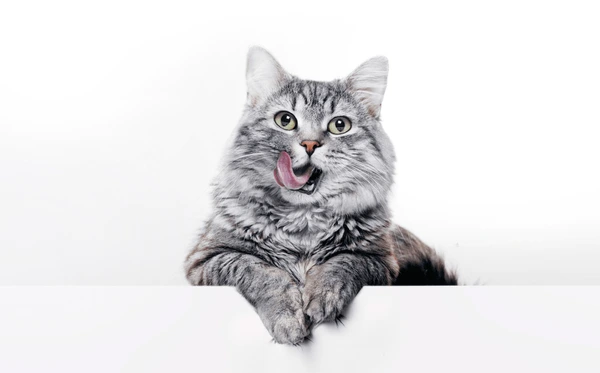

1/1 [==============================] - 0s 475ms/step
[[ 3.4749305 -3.9793797]]
0
The image represents a Cat


In [38]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/Cat_Image.webp


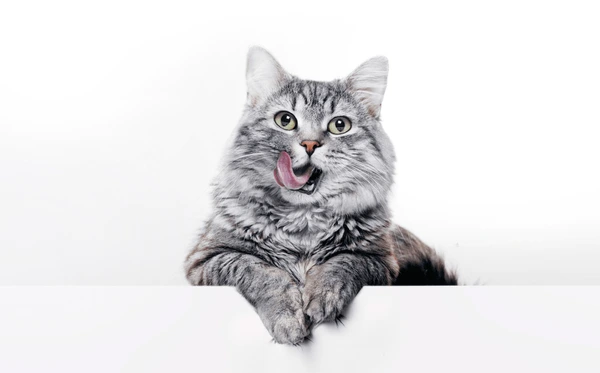

1/1 [==============================] - 0s 44ms/step
[[ 3.4749305 -3.9793797]]
0
The image represents a Cat


In [39]:
#Prediction For Cat


input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/Dog_Image.jpg


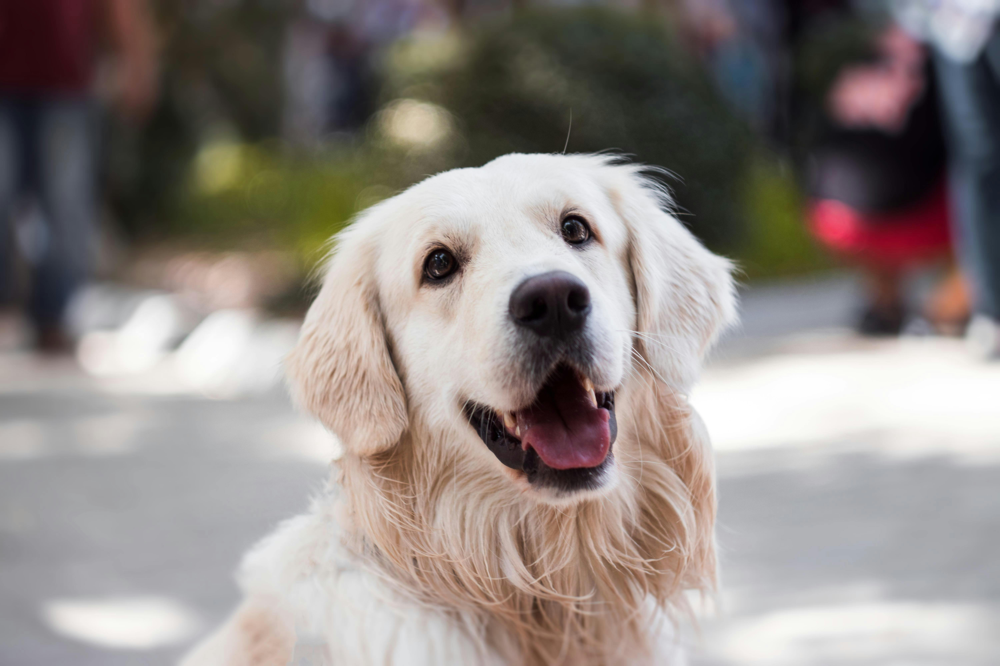

1/1 [==============================] - 0s 42ms/step
[[-4.1741996  4.382722 ]]
1
The image represents a Dog


In [40]:
#Prediction For Dog


input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

In [41]:
# Saving the Model
import pickle

In [43]:
#For storing the Model
file_name = 'Cat_Dog_Classification_Model.sav'
pickle.dump(model,open(file_name,'wb'))

In [ ]:
#Load_Model
loaded_model = pickle.load(open(file_name,'rb'))